### Import data from csvs
Load IMDB data and folder containing all movie csv files-- merge into dataframes

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import dateutil.parser
import seaborn as sns
from IPython.display import Image
import os

fil_path = "../data/srt/srt_csv/"
dir_list = os.listdir(fil_path)

''' Settings '''
sns.set_style("white")
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 20)
pd.set_option('display.precision', 3)

''' Load and concatinate CSV files into single dataframe'''

files=[]
for path in dir_list:
    files.append(
        pd.read_csv(fil_path+path,index_col=0)
    )
df_sub = pd.concat(files)

csv_names = ['../data/imdb_unique_prod-2018-04-21_0924.csv']
files = []
for path in csv_names:
    files.append(
        pd.read_csv(path,index_col=0)
    )
df_movies = pd.concat(files)

# Clean out unnamed column
df_movies = df_movies.loc[:, ~df_movies.columns.str.contains('^Unnamed')]


### Clean Data
- Parse and clean currency data
- Create subtitle time metrics
- Merge movie and subtitles

In [4]:
from currency_converter import CurrencyConverter
from re import sub
import math

# Parse currencies

c = CurrencyConverter()
def parse_currency(value):
    value = str(value)
    currency_type = sub(r'[?!^\d.]', '', value ).replace(',','').rstrip()
    currency_amount = sub(r'[^\d.]', '', value)
    if currency_type == "$":
        currency_type = 'USD'
    if currency_type == "€":
        currency_type = 'EUR'
    if currency_type == "£":
        currency_type = 'GBP'
    if currency_type == "RUR":
        currency_type = 'USD'
    if currency_type == "FRF":
        currency_type = 'EUR'
    if currency_type == "DEM":
        currency_type = 'EUR'
    if currency_type == "":
        currency_type = 'USD'        
    return int(math.ceil(c.convert(currency_amount, currency_type, 'USD')))    

''' Turn currency strings to floats '''

df_movies = df_movies[df_movies['gross_usa'].notnull()]
df_movies = df_movies[df_movies['gross_usa_weekend'].notnull()]
df_movies = df_movies[df_movies['gross_worldwide'].notnull()]
df_movies = df_movies[df_movies['budget'].notnull()]
df_movies['budget'] = df_movies['budget'].apply(parse_currency)
df_movies['gross_usa'] = df_movies['gross_usa'].apply(parse_currency)
df_movies['gross_usa_weekend'] = df_movies['gross_usa_weekend'].apply(parse_currency)
df_movies['gross_worldwide'] = df_movies['gross_worldwide'].apply(parse_currency)


''' Generate time data'''

# Calculate length of line dialogue
df_sub['line_duration'] = df_sub['endTime'] - df_sub['startTime']

# Calculate length of silence between dialouge
df_sub['line_delta'] = df_sub['startTime'] - df_sub['endTime'].shift(1)
df_sub['line_delta'] = df_sub['line_delta'].fillna(0).astype(int)


''' Merge subtitle and movie dataframe '''

df_submov = pd.merge(df_sub, df_movies, on='title')
df_submov.head(5)

,startTime,endTime,text,title,line_duration,line_delta,budget,cast,color,country,description,director,genre,gross_usa,gross_usa_weekend,gross_worldwide,imdb_critic_reviews_total,imdb_popularity,imdb_rating,imdb_ratings_total,imdb_user_reviews_total,language,metacritic_rating,mpaa_rating,poster_image,production_co,release_date,runtime,year
0,99819,101480,Good morning.,Beverly Hills Chihuahua,1661,0,20000000,"Piper Perabo,Manolo Cardona,Jamie Lee Curtis,J...",Color,USA,"Chloe, a diamond-clad ultra-pampered Beverly H...",Raja Gosnell,"Adventure, Comedy, Drama, Family, Romance",94514402,29300465,149281606,98.0,NaN,3.8,"19,267",103,English,NaN,PG,https://ia.media-imdb.com/images/M/MV5BMTI2NzU...,Mandeville Films,3 October 2008 (USA),91.0,2008
1,102188,104179,"Oh, hello who likes to see you.",Beverly Hills Chihuahua,1991,708,20000000,"Piper Perabo,Manolo Cardona,Jamie Lee Curtis,J...",Color,USA,"Chloe, a diamond-clad ultra-pampered Beverly H...",Raja Gosnell,"Adventure, Comedy, Drama, Family, Romance",94514402,29300465,149281606,98.0,NaN,3.8,"19,267",103,English,NaN,PG,https://ia.media-imdb.com/images/M/MV5BMTI2NzU...,Mandeville Films,3 October 2008 (USA),91.0,2008
2,104690,105679,"Oh, look there is.",Beverly Hills Chihuahua,989,511,20000000,"Piper Perabo,Manolo Cardona,Jamie Lee Curtis,J...",Color,USA,"Chloe, a diamond-clad ultra-pampered Beverly H...",Raja Gosnell,"Adventure, Comedy, Drama, Family, Romance",94514402,29300465,149281606,98.0,NaN,3.8,"19,267",103,English,NaN,PG,https://ia.media-imdb.com/images/M/MV5BMTI2NzU...,Mandeville Films,3 October 2008 (USA),91.0,2008
3,106192,107056,Is she?,Beverly Hills Chihuahua,864,513,20000000,"Piper Perabo,Manolo Cardona,Jamie Lee Curtis,J...",Color,USA,"Chloe, a diamond-clad ultra-pampered Beverly H...",Raja Gosnell,"Adventure, Comedy, Drama, Family, Romance",94514402,29300465,149281606,98.0,NaN,3.8,"19,267",103,English,NaN,PG,https://ia.media-imdb.com/images/M/MV5BMTI2NzU...,Mandeville Films,3 October 2008 (USA),91.0,2008
4,108794,110091,"Dude, if I would be nervous.",Beverly Hills Chihuahua,1297,1738,20000000,"Piper Perabo,Manolo Cardona,Jamie Lee Curtis,J...",Color,USA,"Chloe, a diamond-clad ultra-pampered Beverly H...",Raja Gosnell,"Adventure, Comedy, Drama, Family, Romance",94514402,29300465,149281606,98.0,NaN,3.8,"19,267",103,English,NaN,PG,https://ia.media-imdb.com/images/M/MV5BMTI2NzU...,Mandeville Films,3 October 2008 (USA),91.0,2008


### Parse and merge categoricals
Using custom parser to account for any commas in categoricals

In [5]:
import patsy
# Categorize genres
x = df_submov['genre'].str.split('\s*,\s*', expand=True).stack()
df_new = pd.crosstab(x.index.get_level_values(0), x.values).iloc[:, 1:]
df_submov = df_submov.join(df_new)

# Categorize mpaaa
x = df_submov['mpaa_rating'].str.split('\s*,\s*', expand=True).stack()
df_new = pd.crosstab(x.index.get_level_values(0), x.values).iloc[:, 1:]
df_submov = df_submov.join(df_new)

# Categorize color
x = df_submov['color'].str.split('\s*,\s*', expand=True).stack()
df_new = pd.crosstab(x.index.get_level_values(0), x.values).iloc[:, 1:]
df_submov = df_submov.join(df_new)

# Categorize country
x = df_submov['country'].str.split('\s*,\s*', expand=True).stack()
df_new = pd.crosstab(x.index.get_level_values(0), x.values).iloc[:, 1:]
df_submov = df_submov.join(df_new)

# Categorize language
x = df_submov['language'].str.split('\s*,\s*', expand=True).stack()
df_new = pd.crosstab(x.index.get_level_values(0), x.values).iloc[:, 1:]
df_submov = df_submov.join(df_new)


### Save/Load Dataframe
Pickle current dataframes for easy loading

In [ ]:
df_submov.to_pickle('../data/df_submove-2018-04-25-0322.pkl')

In [ ]:
df_submov = pd.read_pickle('../data/df_submove-2018-04-25-0322.pkl')

### Group by title

In [10]:
#df_submov_bytitle = df_submov_bytitle['year'].astype(float)
df_submov_bytitle = df_submov.groupby('title').agg(lambda x: x[x>0].mean())
df_submov_bytitle = df_submov_bytitle.fillna(0)
df_submov_bytitle = df_submov_bytitle[df_submov_bytitle.columns.difference(['startTime','endTime'])]
df_submov_bytitle

,Adventure,Animation,Biography,Canada,China,Color,Comedy,Crime,Drama,Family,Fantasy,Film-Noir,Finland,France,French,Germany,Hindi,History,Hong Kong,Horror,India,Ireland,Italy,Japan,Korean,...,PG-13,R,Romance,Sci-Fi,South Africa,South Korea,Spain,Sport,Swahili,Thriller,UK,USA,War,Western,budget,gross_usa,gross_usa_weekend,gross_worldwide,imdb_critic_reviews_total,imdb_rating,line_delta,line_duration,metacritic_rating,runtime,year
title,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
101 Dalmatians,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,75000000,136189294,45073479,320689294,56.0,5.7,4178.950,2766.305,0.0,103.0,1996
12 Years a Slave,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,20000000,56671993,923715,187733202,601.0,8.1,3266.731,2086.765,0.0,134.0,2013
13 Hours,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,50000000,52853219,16000000,69411370,232.0,7.3,1662.304,1859.239,0.0,144.0,2016
2 Fast 2 Furious,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,76000000,127154901,50472480,107376378,154.0,5.9,3314.502,2251.820,0.0,107.0,2003
2 Guns,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,61000000,75612460,27059130,131940411,270.0,6.7,1975.299,1787.000,0.0,109.0,2013
21 Jump Street,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,42000000,138447667,36302612,201585328,376.0,7.2,1187.751,1991.098,69.0,109.0,2012
27 Dresses,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,30000000,76808654,27442040,160259319,174.0,6.1,729.845,2810.894,0.0,111.0,2008
3 Idiots,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8564290,6532908,1645502,80000000,52.0,8.4,2125.816,2574.651,0.0,170.0,2009
3 Men and a Baby,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,11000000,167780960,10384392,242780960,21.0,5.9,1286.517,2940.515,61.0,102.0,1987


### Genereate pairplot


In [148]:
import seaborn as sns
df_submov_bytitle = df_submov_bytitle[df_submov_bytitle.columns.difference(['metacritic_rating','startTime','endTime','gross_usa_weekend','line_delta','index'])]
df_submov_bytitle = df_submov_bytitle[(df_submov_bytitle['year']>1980)&(df_submov_bytitle['line_duration'] < 4000)]
sns.set(font_scale=2)
df_submov_bytitle = df_submov_bytitle.reset_index()

sns.pairplot(df_submov_bytitle[df_submov_bytitle['year'] > 1980],size = 4)

In [109]:
# For testing - group movies by year for analysis
df_submov_test = df_submov.groupby('year').agg(lambda x: x[x>0].mean())
df_submov_test.sort_values(by='line_duration',ascending=False)

,startTime,endTime,line_duration,line_delta,budget,gross_usa,gross_usa_weekend,gross_worldwide,imdb_critic_reviews_total,imdb_rating,metacritic_rating,runtime,Adventure,Animation,Biography,Comedy,Crime,Drama,Family,Fantasy,Film-Noir,History,Horror,Music,Musical,...,PG-13,R,Color,Canada,China,Finland,France,Germany,Hong Kong,India,Ireland,Italy,Japan,Malta,Netherlands,New Zealand,South Africa,South Korea,Spain,UK,USA,French,Hindi,Korean,Swahili
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1955,3.054e+06,3.057e+06,3216.202,3222.521,4.100e+05,7.260e+05,2.140e+02,9.520e+05,131.000,7.700,NaN,106.000,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
1976,3.343e+06,3.346e+06,3105.529,1964.154,9.600e+05,1.172e+08,5.000e+06,2.250e+08,157.000,8.100,69.000,120.000,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
1972,5.070e+06,5.073e+06,3041.045,3905.028,6.000e+06,1.350e+08,3.024e+05,2.451e+08,223.000,9.200,100.000,175.000,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
1990,3.711e+06,3.714e+06,2846.388,3306.339,3.648e+07,1.402e+08,1.599e+07,2.688e+08,104.846,7.213,68.224,126.594,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN,NaN,NaN,1.0,NaN,...,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
1979,3.312e+06,3.315e+06,2826.874,3332.143,1.608e+07,5.492e+07,4.906e+06,1.104e+08,201.956,7.623,83.000,111.993,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,...,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN
1987,3.035e+06,3.038e+06,2816.630,2665.754,1.584e+07,1.389e+08,9.370e+06,1.791e+08,79.049,6.780,67.933,112.274,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
1995,3.473e+06,3.476e+06,2786.852,2609.400,4.643e+07,9.274e+07,1.395e+07,1.990e+08,121.516,7.454,69.986,123.019,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,...,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN
1993,3.780e+06,3.783e+06,2771.335,3132.229,4.483e+07,1.778e+08,2.153e+07,4.063e+08,159.226,7.664,79.651,149.833,1.0,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,...,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
1947,3.662e+06,3.665e+06,2750.020,2012.762,2.000e+06,3.250e+05,1.044e+03,1.500e+06,73.000,8.000,NaN,124.000,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN


### Plot correlation table

In [ ]:
from matplotlib import rcParams
rcParams['figure.dpi'] = 300
plt.style.use('fivethirtyeight')
plt.rcParams.update({'font.size': 22})
plt.subplots(figsize=(20,15))
sns.heatmap(df_submov_bytitle.corr())

### Fix categoricals columns
Remove any columns with spaces or hyphens

In [11]:
df_submov_bytitle['SciFi'] = df_submov_bytitle['Sci-Fi']
df_submov_bytitle['FilmNoir'] = df_submov_bytitle['Film-Noir']
df_submov_bytitle['PG13'] = df_submov_bytitle['PG-13']
df_submov_bytitle['NotRated'] = df_submov_bytitle['Not Rated']
df_submov_bytitle['HongKong'] = df_submov_bytitle['Hong Kong']
df_submov_bytitle['SouthKorea'] = df_submov_bytitle['South Korea']
df_submov_bytitle['SouthAfrica'] = df_submov_bytitle['South Africa']
df_submov_bytitle['NewZealand'] = df_submov_bytitle['New Zealand']
df_submov_bytitle = df_submov_bytitle.drop(['Sci-Fi','Film-Noir','PG-13','Not Rated','South Africa','South Korea','Hong Kong','New Zealand'],axis=1) 

# Modeling

In [37]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV

import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.sandbox.regression.predstd import wls_prediction_std
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

In [38]:
# Formula variables
countries_formula = "+Canada+China+Finland+France+Germany+HongKong+India+Ireland+Italy+Japan+Netherlands+NewZealand+SouthAfrica+SouthKorea+Spain+UK+USA+Malta"
language_formula  = "+French+Hindi+Korean+Swahili"
imdb_formula      = "year + budget+gross_usa + gross_usa_weekend + gross_worldwide + imdb_rating+imdb_critic_reviews_total + runtime"
genre_formula     = "+Adventure+Animation+Biography+Color+Comedy+Crime+Drama+Family+Fantasy+FilmNoir+History+Horror+Music+Musical+Mystery+Romance+SciFi+Sport+Thriller+War+Western"
ratings_formula   = "+R+PG13+NotRated"
final_equation = "+Comedy+Romance+SciFi+Western"

# Compose final formula formula 
regression_formula = imdb_formula + genre_formula + ratings_formula + countries_formula + language_formula
#regression_formula = imdb_formula + genre_formula + ratings_formula + language_formula
#regression_formula = imdb_formula + genre_formula + ratings_formula
#regression_formula = imdb_formula + final_equation

### Save current dataframe to pickle

In [ ]:
df_submov_bytitle.to_pickle('../data/pre_regression-df_submov_bytitle.pkl')

In [ ]:
df_submov_bytitle.from_pickle('../data/pre_regression-df_submov_bytitle.pkl')

### Model with SKLearn and Patsy

In [39]:
from sklearn import preprocessing, linear_model, pipeline
from sklearn.preprocessing import StandardScaler

# start with a clean model
df_model = df_submov_bytitle.copy()

# Filter data
df_model = df_model[(df_model['year'] > 1980) & (df_model['line_duration'] <8000)]

# Scale data -- Removed
'''
#scalar = StandardScaler()
#df_scaled = scalar.fit_transform(df_submov_bytitle)
#df_scaled = pd.DataFrame(df_scaled,columns=df_submov_bytitle.columns)
'''

# Create patsy matrix and linear regression model
y, X = patsy.dmatrices("line_duration ~"+regression_formula, data=df_model, return_type="dataframe")
lr = LinearRegression()
model = lr.fit(X,y)
score = lr.score(X,y)

# Predict film in dataframe
predict = lr.predict(X.iloc[1].reshape(1, -1))
actual  = df_model.iloc[1]['line_duration']

print(f'score={score}, predict={predict}, actual={actual}')

score=0.22261193700976944, predict=[[2308.05646133]], actual=2086.765141318977


/Users/justinblinder/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:24: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead


### Generate summary via statsmodels

In [17]:
##### import io
lsm = smf.ols('line_duration ~'+regression_formula, data = df_model)
fit1 = lsm.fit()
fit1.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          line_duration   R-squared:                       0.223
Model:                            OLS   Adj. R-squared:                  0.168
Method:                 Least Squares   F-statistic:                     4.088
Date:                Sun, 29 Apr 2018   Prob (F-statistic):           8.78e-18
Time:                        18:05:37   Log-Likelihood:                -5708.6
No. Observations:                 780   AIC:                         1.152e+04
Df Residuals:                     728   BIC:                         1.176e+04
Df Model:                          51                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                  4.402e+04   5792.360      7.600      0.000    3.27e+04    5.54e+04
year                        -20.8040      2.885     -7.210      0.000     -26.469     -15.139
budget                     4.408e-07   3.99e-07      1.105      0.270   -3.42e-07    1.22e-06
gross_usa                 -2.111e-07   4.14e-07     -0.510      0.610   -1.02e-06    6.01e-07
gross_usa_weekend          1.557e-06   8.47e-07      1.840      0.066   -1.05e-07    3.22e-06
gross_worldwide           -1.085e-07   1.35e-07     -0.802      0.423   -3.74e-07    1.57e-07
imdb_rating                 -21.5810     20.195     -1.069      0.286     -61.229      18.067
imdb_critic_reviews_total    -0.0874      0.166     -0.526      0.599      -0.414       0.239
runtime                      -0.0985      0.643     -0.153      0.878      -1.360       1.163
Adventure                   -74.5074     41.147     -1.811      0.071    -155.288       6.274
Animation                    51.4136     63.644      0.808      0.419     -73.535     176.362
Biography                   -76.1242     70.564     -1.079      0.281    -214.657      62.409
Color                         4.2221     92.258      0.046      0.964    -176.902     185.346
Comedy                      -61.1943     44.106     -1.387      0.166    -147.785      25.396
Crime                       -40.1105     43.767     -0.916      0.360    -126.034      45.813
Drama                        43.0057     37.584      1.144      0.253     -30.779     116.791
Family                       79.4520     68.960      1.152      0.250     -55.932     214.836
Fantasy                      43.1297     41.633      1.036      0.301     -38.605     124.864
FilmNoir                   4.748e-13   8.88e-13      0.535      0.593   -1.27e-12    2.22e-12
History                     147.5600     84.111      1.754      0.080     -17.569     312.688
Horror                      -57.1584     70.945     -0.806      0.421    -196.439      82.123
Music                         0.4984     83.423      0.006      0.995    -163.280     164.277
Musical                     171.1022     86.579      1.976      0.049       1.128     341.077
Mystery                      87.2438     47.478      1.838      0.067      -5.966     180.454
Romance                      20.7993     43.055      0.483      0.629     -63.728     105.326
SciFi                       -69.4688     40.416     -1.719      0.086    -148.814       9.877
Sport                        97.8323     80.407      1.217      0.224     -60.025     255.689
Thriller                     28.6269     40.107      0.714      0.476     -50.113     107.366
War                         -11.3001     83.086     -0.136      0.892    -174.416     151.816
Western                     -88.4981     90.667     -0.976      0.329    -2

## Using statsmodels

score=0.22261193700976944, predict=[[2308.05646133]], actual=2086.765141318977


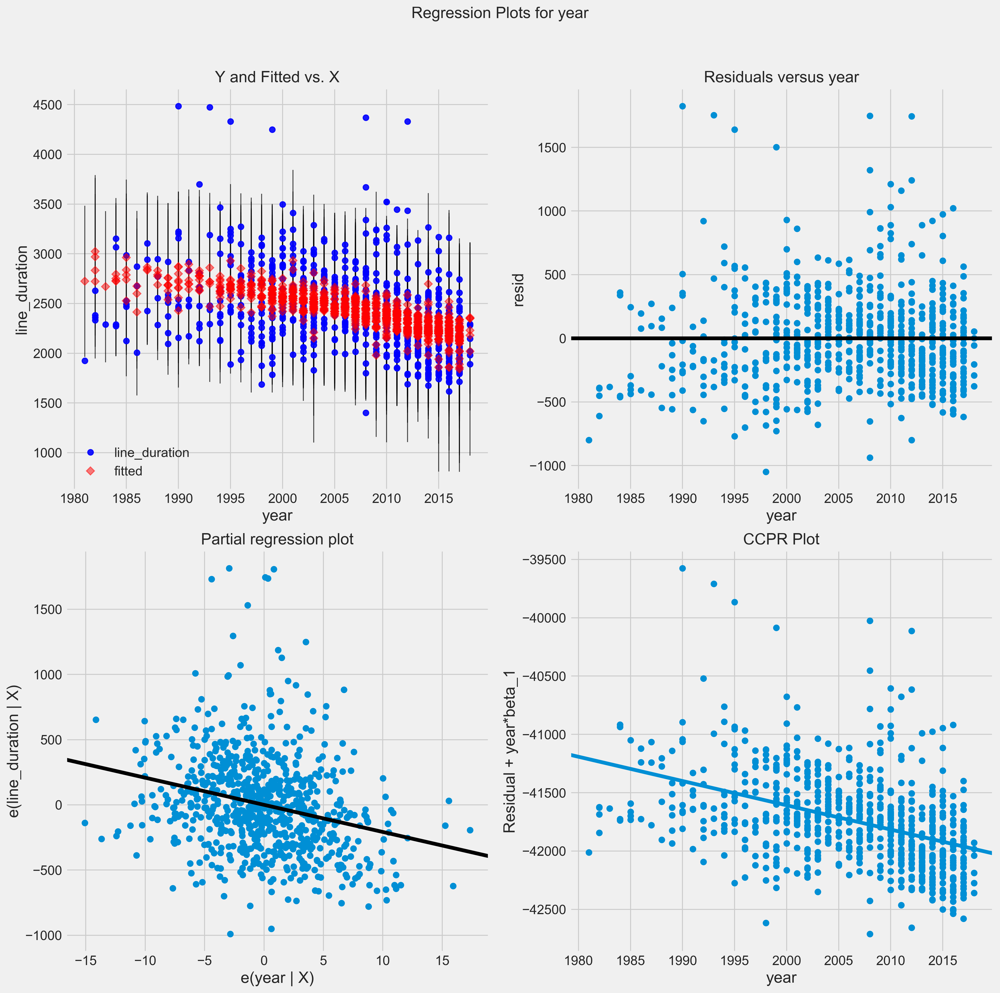

In [50]:
from matplotlib import rcParams

# Setup Styles
rcParams['figure.figsize'] = 15,8
rcParams['figure.dpi'] = 300
plt.style.use('fivethirtyeight')

# Filter data
df_r = df_submov_bytitle.copy()
df_r = df_r[(df_r['line_duration'] <  8000)]
df_r = df_r[df_r.columns.difference(['startTime','endTime'])]
df_r = df_r.reset_index()
df_r = df_r.drop('title',axis=1)
df_r = df_r[(df_r['year'] > 1980)]  

# Create an empty model
X = df_r.loc[:, df_r.columns != 'line_duration']  # Choose predictor variables
y = df_r['line_duration']                         # Choose response variable(s)

# Fit the model to the full dataset
y, X = patsy.dmatrices("line_duration ~"+regression_formula, data=df_r, return_type="dataframe")
model = sm.OLS(y,X)
result = model.fit()

print(f'score={score}, predict={predict}, actual={actual}')

# Plot - Specify variable that should be analyized
fig = plt.figure(figsize=(15,15))
fig = sm.graphics.plot_regress_exog(result, "year", fig=fig)


### Perform Cross Validation

In [20]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
k_folds = KFold(n_splits=10, shuffle=True)

# 10-fold cross-validation with our fake data
reg = linear_model.LinearRegression()
scores = cross_val_score(lr, X, y, cv=k_folds, scoring='r2')

# scores output is negative, a sklearn quirk bc mse is used to min. optimization func.
print(scores)

y_pred = cross_val_predict(reg, X, y, cv=k_folds)

np.mean(scores)

[-0.01248441  0.26024298  0.16379837  0.12741241 -0.03873768  0.1644567
  0.01203384  0.15056302  0.11093381  0.20070452]


0.11389235612154058

### Perform test train split

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

lr_split = LinearRegression(fit_intercept=True)
lr_split.fit(X_train, y_train)
predict = lr_split.predict(X_test)

train_score = lr_split.score(X_train,y_train)
test_score = lr_split.score(X_test,y_test)
print(f'train: {train_score}, test:{test_score}')

train: 0.21549567883121556, test:0.17067964694780968


## Lasso

/Users/justinblinder/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


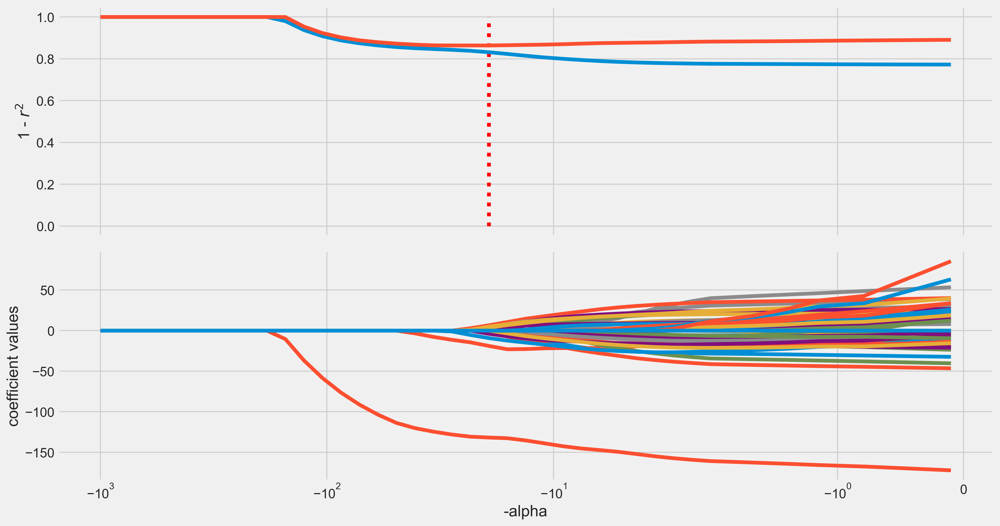

In [72]:
from sklearn.model_selection import cross_validate

lasso_pipe = pipeline.Pipeline([
    ("imp", preprocessing.Imputer()), 
    ("std", preprocessing.StandardScaler()),
    ("lasso", linear_model.Lasso())
])
fig, axes = plt.subplots(2,1, figsize=(15, 8), sharex=True, tight_layout=True)

# start lower -- .1
alphas = np.logspace(-1,3, num=50)
coefs = []
train_scores = []
test_scores = []
#fig, axes = plt.subplots(1,len(alphas), figsize=(20, 8), sharey=True)
for i, alpha in enumerate(alphas):
    lasso_pipe.set_params(lasso__alpha=alpha)
    cv_result = cross_validate(lasso_pipe, X=X, y=y, cv=10, return_train_score=True)
    train_scores.append(np.maximum(np.mean(cv_result['train_score']), 0))
    test_scores.append(np.maximum(np.mean(cv_result['test_score']), 0))
    lasso_pipe.fit(X_train, y_train)
    coefs.append(lasso_pipe.named_steps["lasso"].coef_)
    

coefs = np.squeeze(coefs, axis=1)
ax0 = axes.flat[0]
ax0.plot(-alphas, 1 - np.array(train_scores), label="train")
ax0.plot(-alphas, 1 - np.maximum(test_scores, 0), label="test")
best_i = np.argmax(test_scores)
ax0.vlines(-alphas[best_i], 0,1, colors="red", linestyles="dotted")
ax0.set_ylabel("1 - $r^2$")
ax1 = axes.flat[1]
ax1.plot(-alphas,coefs)
ax1.set_ylabel("coefficient values")
ax1.set_xlabel("-alpha")
ax1.set_xscale("symlog")
plt.xscale("symlog")

### Create model with Lasso coefficients

score=0.22261193700976944, predict=[[2308.05646133]], actual=2086.765141318977


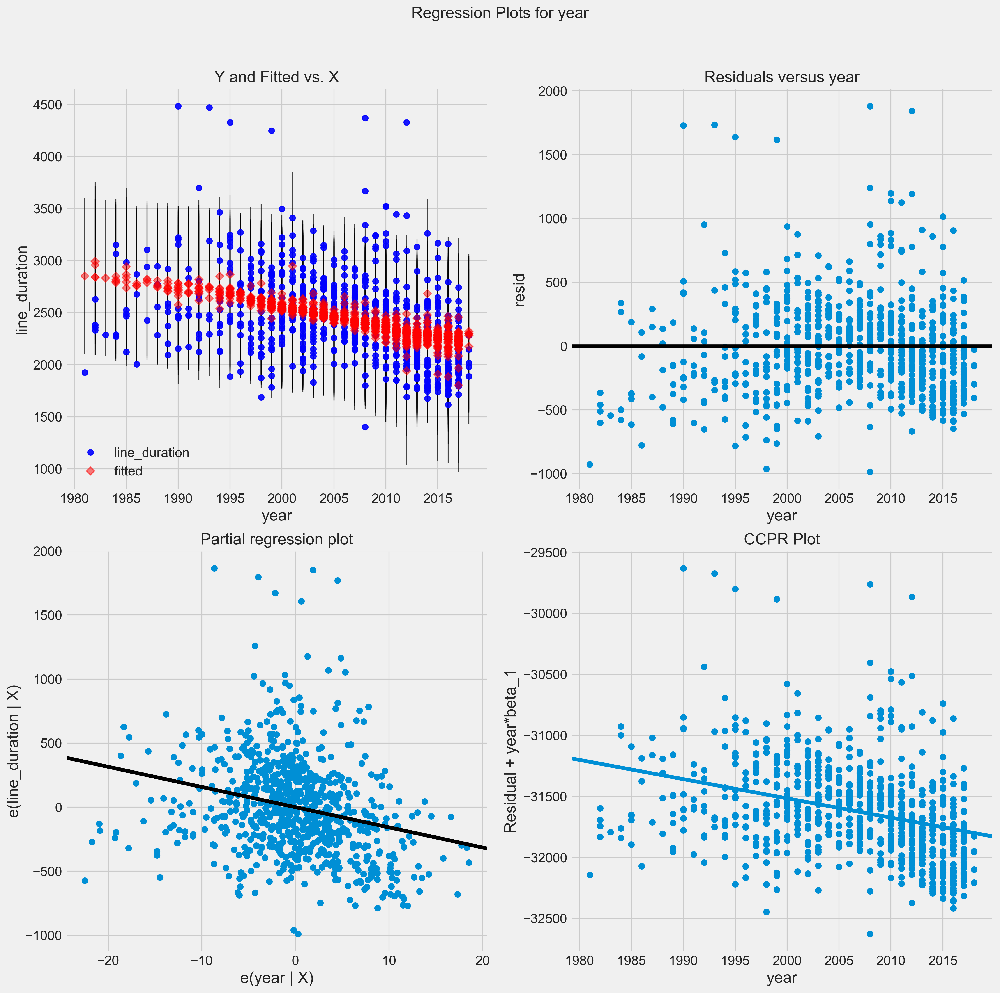

In [74]:
lasso_equation = "year + imdb_critic_reviews_total+Comedy+Drama+History+Music+Musical+Sport+Western+Japan+NewZealand+Spain"
from matplotlib import rcParams

# Setup Styles
rcParams['figure.figsize'] = 15,8
rcParams['figure.dpi'] = 300
plt.style.use('fivethirtyeight')

# Filter data
df_r = df_submov_bytitle.copy()
df_r = df_r[(df_r['line_duration'] <  8000)]
df_r = df_r[df_r.columns.difference(['startTime','endTime'])]
df_r = df_r.reset_index()
df_r = df_r.drop('title',axis=1)
df_r = df_r[(df_r['year'] > 1980)]  

# Create an empty model
X = df_r.loc[:, df_r.columns != 'line_duration']  # Choose predictor variables
y = df_r['line_duration']                         # Choose response variable(s)

# Fit the model to the full dataset
y, X = patsy.dmatrices("line_duration ~"+lasso_equation, data=df_r, return_type="dataframe")
model = sm.OLS(y,X)
result = model.fit()

print(f'score={score}, predict={predict}, actual={actual}')

# Plot - Specify variable that should be analyized
fig = plt.figure(figsize=(15,15))
fig = sm.graphics.plot_regress_exog(result, "year", fig=fig)


### Ridge

/Users/justinblinder/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


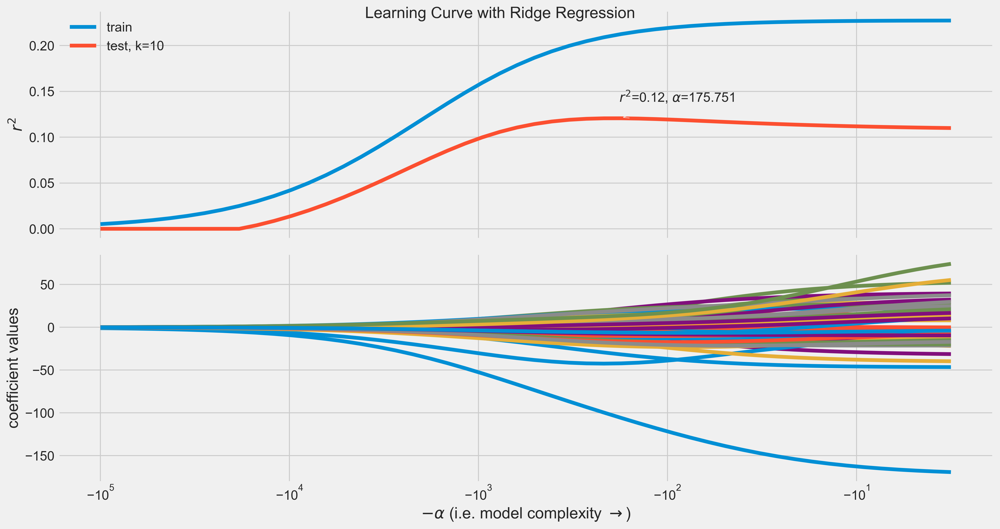

In [53]:
from sklearn import pipeline, feature_selection, model_selection, linear_model, preprocessing

ridge_pipe  = pipeline.Pipeline([
     ("imp", preprocessing.Imputer()), 
     ("std", preprocessing.StandardScaler()),
     ("var", feature_selection.VarianceThreshold()), 
     ("ridge", linear_model.Ridge())
    ])
# alphas look best when logspaced
alphas = np.logspace(.5, 5, num=50)
coefs = []
train_scores = []
test_scores = []

# loop through each of the 50 alphas
for i, alpha in enumerate(alphas):
    # set the alpha for our pipeline
    ridge_pipe.set_params(ridge__alpha=alpha)
    # cross validate and store the results
    cv_result = model_selection.cross_validate(
        ridge_pipe, X=X, y=y, cv=10, return_train_score=True)
    # use np.maximum(., 0) to make sure the scores don't go below zero (makes for ugly plots tbh)
    train_scores.append(np.maximum(np.mean(cv_result['train_score']), 0))
    test_scores.append(np.maximum(np.mean(cv_result['test_score']), 0))
    
    # fit again to grab coefficients
    ridge_pipe.fit(X_train, y_train)
    coefs.append(ridge_pipe.named_steps["ridge"].coef_)
# set up the figure. I'll do the learning curve above and coefficient path below
fig, axes = plt.subplots(2, 1, figsize=(15, 8), sharex=True, tight_layout=True)
# list of arrays -> single array
coef_arr = np.squeeze(coefs, axis=1)
# grab the first axis
ax0 = axes.flat[0]
# plot train and test curves
ax0.plot(-alphas, train_scores, label="train")
ax0.plot(-alphas, test_scores, label="test, k=10")
# find the index of the best score
best_i = np.argmax(test_scores)
# annotate score
ann_xy = (-alphas[best_i], test_scores[best_i])
ann_text = f"$r^2$={test_scores[best_i]:.2}, $\\alpha$={alphas[best_i]:g}"
ax0.annotate(ann_text, xy=ann_xy, xytext=(.6,.6), textcoords='axes fraction',
            arrowprops=dict(arrowstyle="->"),
            )
ax0.set_ylabel("$r^2$")
ax0.legend()

# grab the second axis
ax1 = axes.flat[1]
ax1.plot(-alphas, coef_arr)
ax1.set_ylabel("coefficient values")
ax1.set_xlabel("$-\\alpha$ (i.e. model complexity $\\rightarrow$)")
fig.suptitle("Learning Curve with Ridge Regression")
plt.xscale("symlog")


In [62]:
var_support = ridge_pipe.named_steps["var"].get_support()
feat = X.columns[var_support]
coef = ridge_pipe.named_steps["ridge"].coef_
sort_i = np.argsort(-np.abs(coef))

#plt.figsize(15,8)
n_plot = 30
ind = np.arange(n_plot)

plt.scatter(ind, coef[sort_i][:n_plot])
plt.xticks(ind, feat[sort_i][:n_plot], rotation=90);
plt.title("Top coefficients for CV-optimized lasso model")
plt.ylabel("coefficient");

IndexError: index 6 is out of bounds for axis 0 with size 1